In [ ]:
!nvidia-smi

Mon May 15 08:35:16 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    11W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import os
HOME = os.getcwd()
print (HOME)


/content


In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output
!yolo mode=checks


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.2/566.2 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 kB 23.6 MB/s eta 0:00:00
WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.97 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


In [ ]:
from ultralytics import YOLO
from IPython.display import display,Image

In [ ]:
%cd {HOME}
!pip install roboflow --quiet


from roboflow import Roboflow
rf = Roboflow(api_key="Use your Roboflow API")
project = rf.workspace("btp-dataset").project("waste-material-detection")
dataset = project.version(8).download("yolov8")

/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.97, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to waste-material-detection-8 in yolov8:: 100%|██████████| 438/438 [00:00<00:00, 1289.62it/s]


In [ ]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=200 imgsz=800

/content
Ultralytics YOLOv8.0.97 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/waste-material-detection-8/data.yaml, epochs=200, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=

In [ ]:
!ls {HOME}/runs/detect/train0002/

args.yaml					    R_curve.png
confusion_matrix_normalized.png			    results.csv
confusion_matrix.png				    results.png
events.out.tfevents.1683696478.152eaf6995e5.5107.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
P_curve.png					    val_batch0_pred.jpg
PR_curve.png					    weights


/content


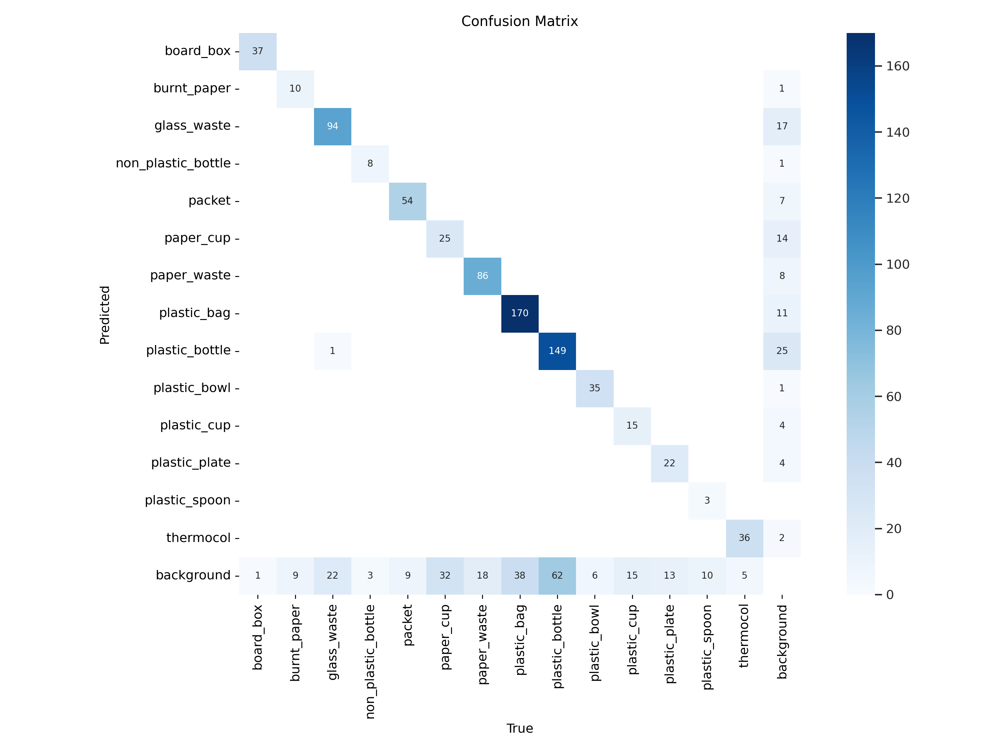

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/confusion_matrix.png'
, width=900)

In [ ]:
import pandas as pd

# Set the path to the CSV file
csv_path = f"{HOME}/runs/detect/train0002/results.csv"

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_path)

# Display the DataFrame in the notebook
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,2.4942,5.12520,1.66240,0.01513,0.02312,0.01049,0.00512,1.91930,4.00540,1.40320,0.089200,0.001200,0.001200
1,1,2.2003,3.43200,1.46230,0.02963,0.05057,0.02112,0.01243,2.09390,6.83870,1.48380,0.077488,0.002488,0.002488
2,2,2.0804,2.62820,1.38970,0.07619,0.05230,0.05453,0.03553,1.83520,3.62770,1.39410,0.065762,0.003762,0.003762
3,3,2.0116,2.39340,1.34750,0.14407,0.12320,0.11317,0.07575,1.83670,3.06360,1.37660,0.054024,0.005024,0.005024
4,4,1.9807,2.23170,1.33140,0.12732,0.09793,0.09564,0.06341,1.77320,2.48200,1.33410,0.042273,0.006273,0.006273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,195,1.0557,0.60016,0.90707,0.91224,0.69109,0.76741,0.55434,0.95355,0.59112,0.90364,0.000397,0.000397,0.000397
196,196,1.0704,0.59997,0.90903,0.92547,0.67923,0.76602,0.55943,0.93213,0.58967,0.89973,0.000347,0.000347,0.000347
197,197,1.0748,0.60580,0.90381,0.93464,0.68267,0.76312,0.55823,0.93165,0.58670,0.90091,0.000298,0.000298,0.000298
198,198,1.0528,0.59040,0.91210,0.92945,0.68065,0.76176,0.55776,0.93591,0.58720,0.90251,0.000249,0.000249,0.000249


/content


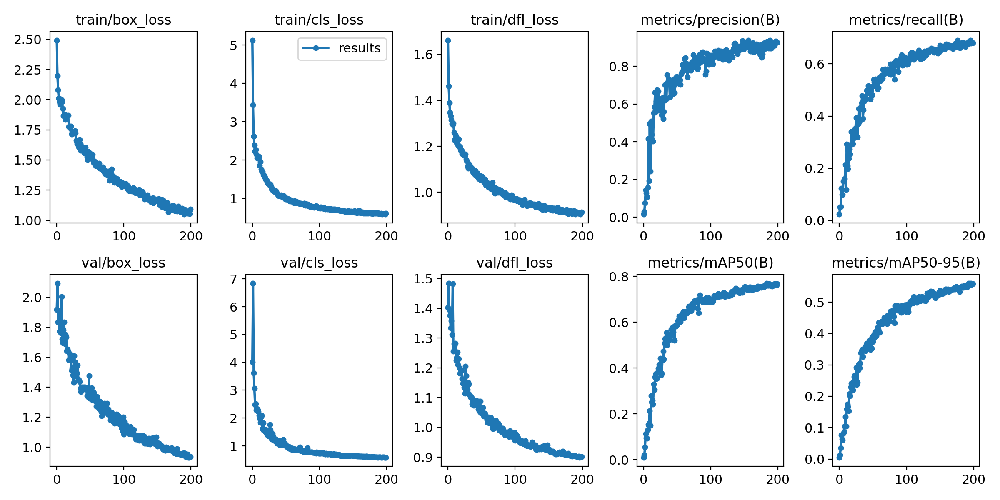

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/results.png'
, width=900)

/content


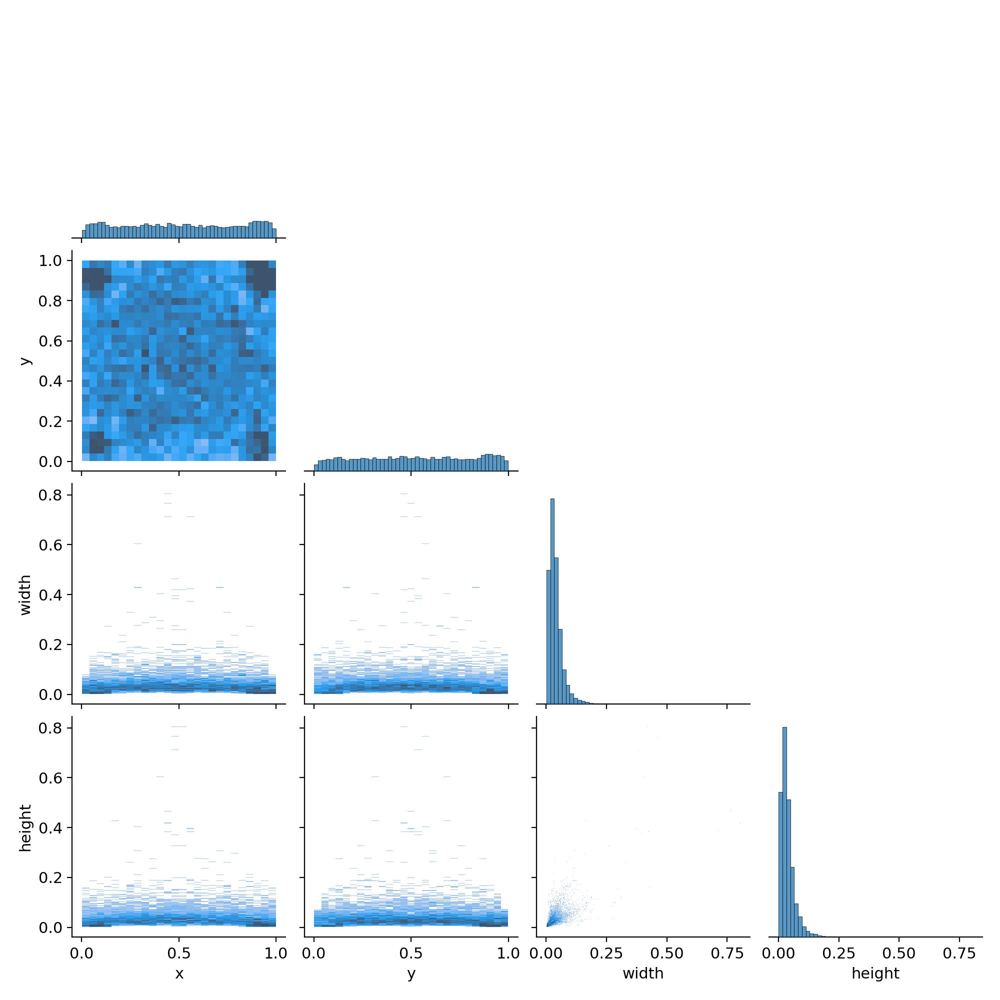

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/labels_correlogram.jpg'
, width=600)

/content


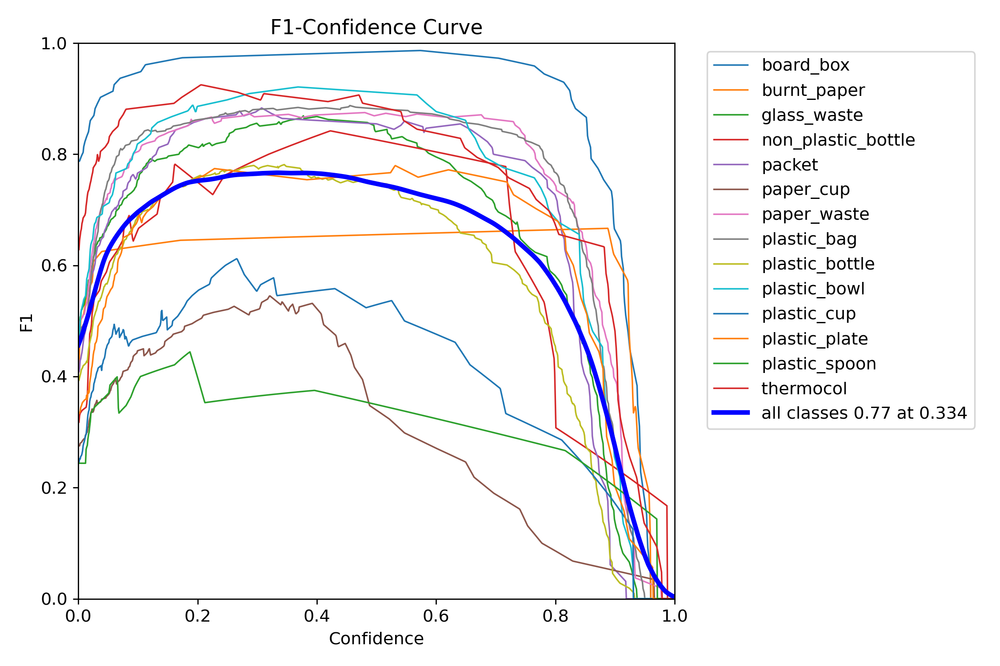

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/F1_curve.png'
, width=600)

/content


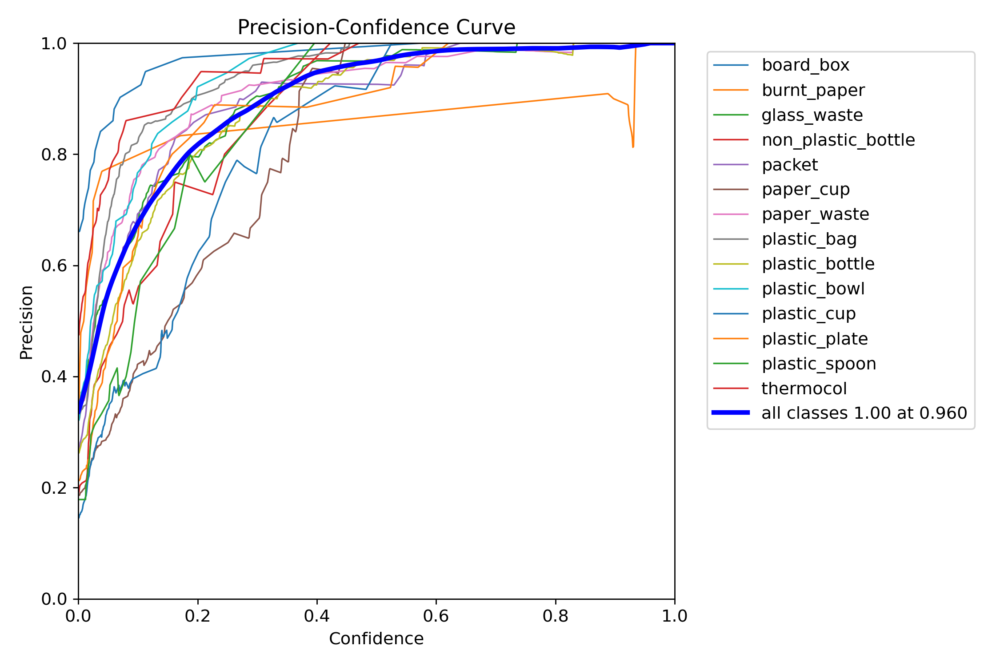

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/P_curve.png'
, width=600)

/content


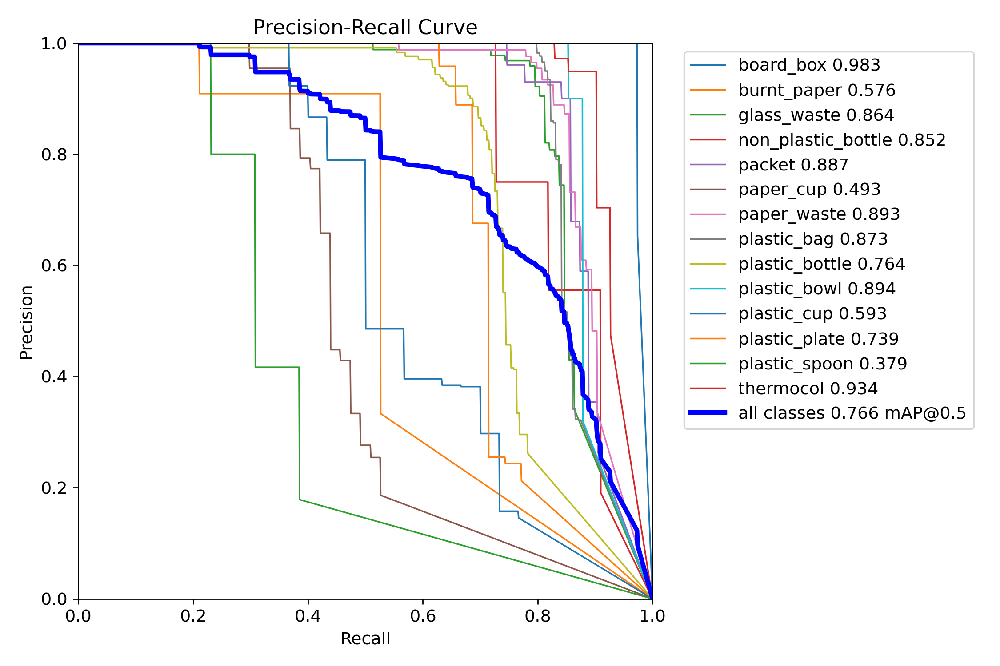

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/PR_curve.png'
, width=600)

%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train/R_curve.png	'
, width=2000)

/content


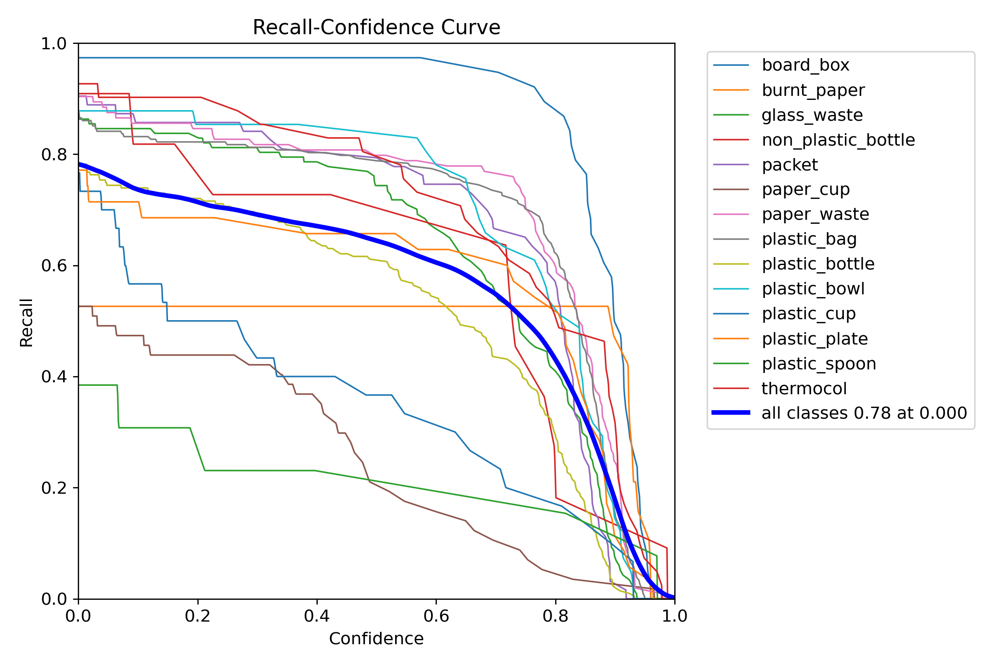

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/R_curve.png'
, width=600)

/content


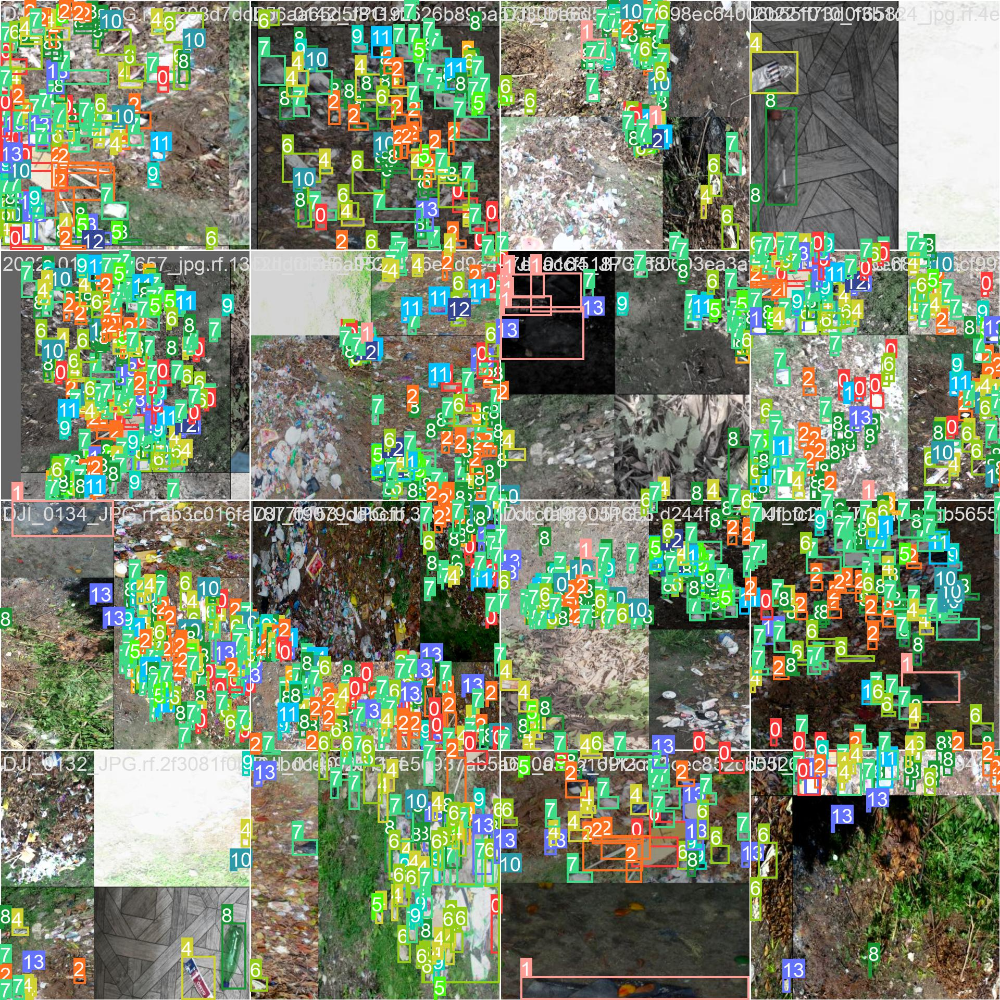

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/train0002/train_batch0.jpg'
, width=1000)

In [ ]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/train0002/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.97 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/waste-material-detection-8/valid/labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100% 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:01<00:00,  1.06s/it]
                   all         10        988      0.927      0.679      0.767      0.563
             board_box         10         38      0.986      0.974      0.983      0.864
           burnt_paper         10         19      0.853      0.526      0.576      0.537
           glass_waste         10        117       0.94      0.795      0.865      0.605
    non_plastic_bottle         10         11       0.93      0.727       0.85      0.548
                packet         10         63      0.927      0.808      0.887      0.657
             paper_cup      

In [ ]:
!ls {HOME}/runs/detect/val/

confusion_matrix_normalized.png  P_curve.png   val_batch0_labels.jpg
confusion_matrix.png		 PR_curve.png  val_batch0_pred.jpg
F1_curve.png			 R_curve.png


/content


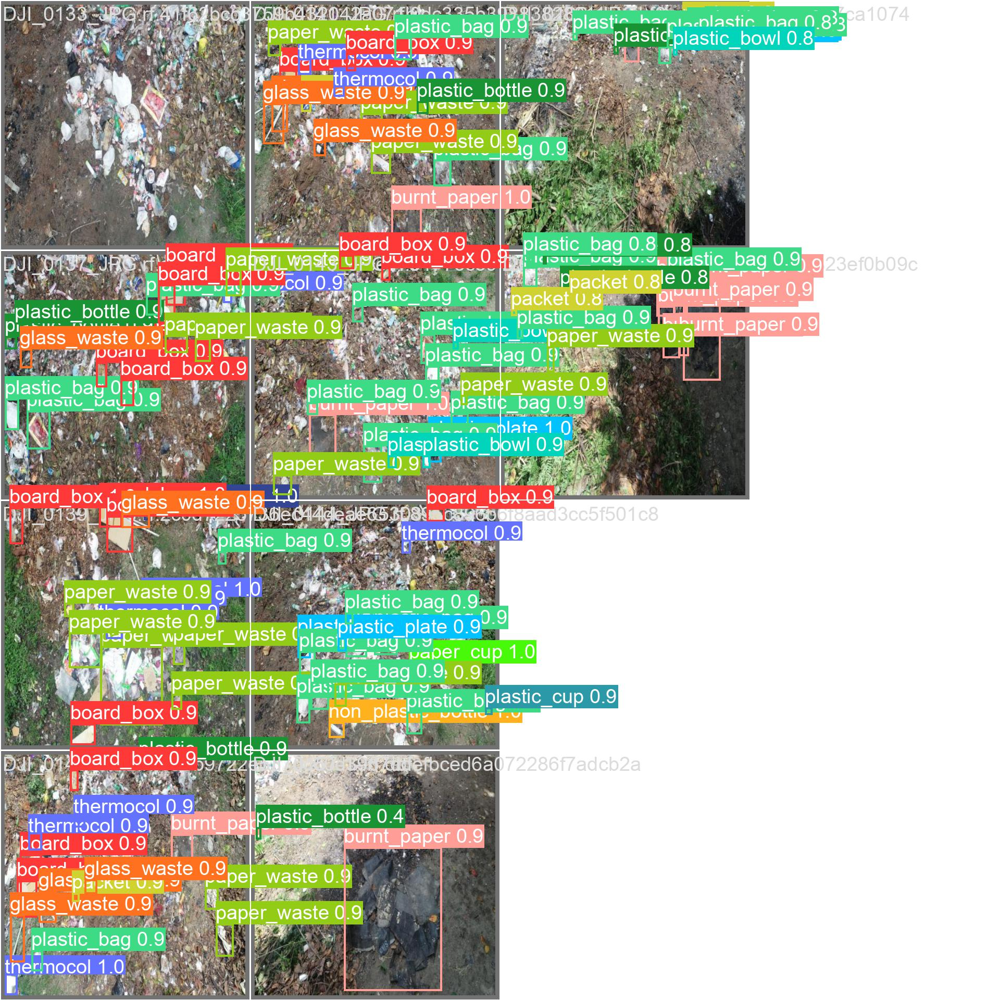

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/val/val_batch0_pred.jpg'
,width=600)

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train0002/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.97 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11131002 parameters, 0 gradients, 28.5 GFLOPs

image 1/5 /content/waste-material-detection-8/test/images/DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg: 800x800 5 board_boxs, 21 glass_wastes, 10 packets, 6 paper_cups, 17 paper_wastes, 30 plastic_bags, 30 plastic_bottles, 4 plastic_bowls, 2 plastic_cups, 8 plastic_plates, 2 plastic_spoons, 3 thermocols, 24.7ms
image 2/5 /content/waste-material-detection-8/test/images/DJI_0144_JPG.rf.720415b0eb8c2a25c82e9e8076815772.jpg: 800x800 6 board_boxs, 23 glass_wastes, 1 non_plastic_bottle, 3 packets, 25 paper_cups, 10 paper_wastes, 22 plastic_bags, 39 plastic_bottles, 7 plastic_bowls, 9 plastic_plates, 1 plastic_spoon, 3 thermocols, 24.9ms
image 3/5 /content/waste-material-detection-8/test/images/DJI_0145_JPG.rf.bb358448bfc3ad6d67f5c744404501c3.jpg: 800x800 1 burnt_paper, 1 glass_waste, 1 paper_waste, 4 plastic_

In [ ]:
!ls {HOME}/runs/detect/predict/

DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg
DJI_0144_JPG.rf.720415b0eb8c2a25c82e9e8076815772.jpg
DJI_0145_JPG.rf.bb358448bfc3ad6d67f5c744404501c3.jpg
DJI_0150-1-.rf.b2449bca1e1fce40619621cf03a7949c.jpg
DJI_0158_JPG.rf.b8d2e56dad6de163d848665d3753be0e.jpg


/content


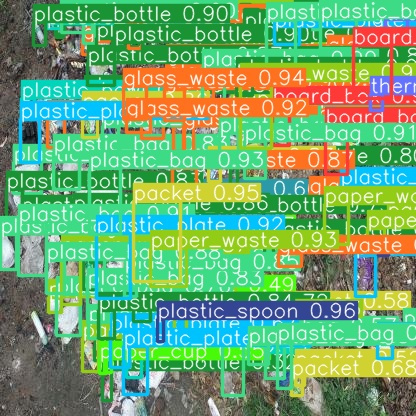

In [ ]:
%cd  {HOME}
Image(filename=f'{HOME}/runs/detect/predict/DJI_0134_JPG.rf.33f201367ee3d88494f90c70cf034afe.jpg'
,width=600)

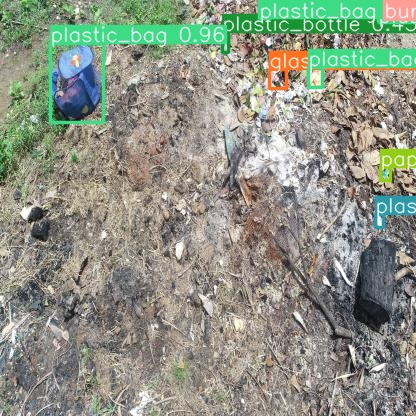

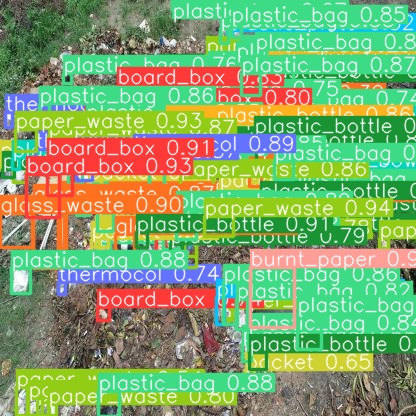

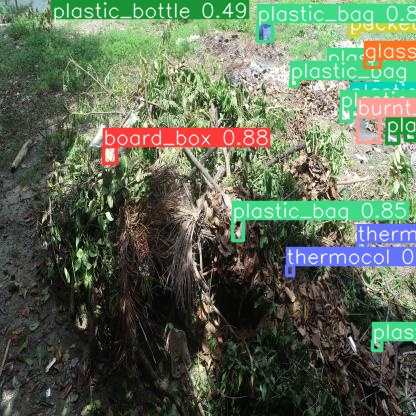

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
%load tensorboard
%tensorboard --logdir=runs/

<IPython.core.display.Javascript object>